In [1]:
import numpy as np
import pickle
import utils
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim


from torch.utils.data import DataLoader, TensorDataset, random_split
from sklearn.model_selection import train_test_split

import textwrap

You've been hired by an eccentric bike company as an AI engineer to help with their prototyping software. For your probationary assignment, company has asked for a tool to help their designers visualize design concepts. They want to provide a partial image, some design parameters that they have selected for the design, and a marketing prompt. Your job is to use your AI magic to create a visualization of the completed design concept. However, your manager has "thrown you off the deep end," and isn't the best at answering your questions. For example, since you have no idea how to interpret the designers' jargon, you have no idea what each parameter is referring to on the bike! A lot of the bikes also look very strange or even physically infeasible and nobody seems to be able to explain why. In any case, it's not your business. Fortunately the company has provided a set of 10,000 previous design concepts (these engineers stay busy!) along with their parameters and marketing pitches. This gives you some hope to train a genrative model! For your probationary assessment, the company has also provided 1000 test designs to evaluate, but has not provided the completed images. They want you to use your "AI magic" to predict the complete designs and they will evaluate how accurately you were able to do so. 

In short, your task is to reconstruct a full image of a bicycle given a partially masked version of the bicycle.

### Exploring The Data

We have prepared a helper function to load up the data. Let's call that function and take a look at the different components of our data

In [2]:
_, masks, parametric, description, images = utils.load_data()

Let's have a look at the first entry of the parametric data. We can see that we have a few specified parametric values that aren't labeled in any way. the rest of the values are nans.  

In [3]:
# randomly mask images
def mask_images(images, masks):
    masked_images = images.copy()
    mask_channels = np.zeros_like(images[:,0:1,:,:])
    for i in range(len(images)):
        mask_channel = np.zeros_like(images[i,0])
        mask_channel[:,masks[i,0]:masks[i,2]] += 1
        mask_channel[masks[i,3]:masks[i,1],:] += 1
        
        mask_channel = mask_channel>1
        
        masked_images[i,:,mask_channel] = 255
        
        mask_channels[i] = ~mask_channel
    return masked_images, mask_channels

masked_images, mask_channels = mask_images(images, masks)
mask_added_images = np.concatenate([masked_images/255, mask_channels], axis=1)
images = images/255
masked_images = masked_images/255

In [4]:
print(f"images: array with shape: {masked_images.shape}")
print(f"masked_images: array with shape: {masked_images.shape}")
print(f"mask_channels: array with shape: {mask_channels.shape}")
print(f"mask_added_images: array with shape: {mask_added_images.shape}")

images: array with shape: (10000, 3, 80, 128)
masked_images: array with shape: (10000, 3, 80, 128)
mask_channels: array with shape: (10000, 1, 80, 128)
mask_added_images: array with shape: (10000, 4, 80, 128)


Ok, now let's take a look at the complete images, masked images and the marketing descriptions:

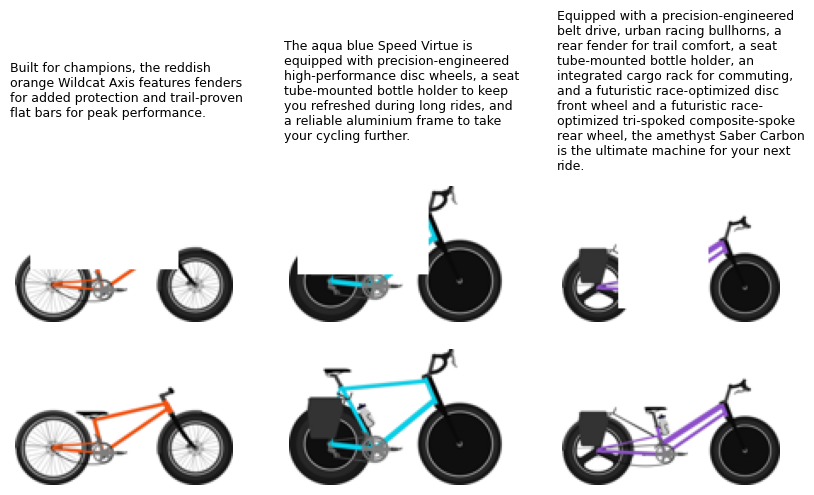

In [5]:
# Visualize 3 masked and complete images side by side
fig, ax = plt.subplots(3, 3, figsize=(10, 6))
for i in range(3):
    wrapped_text = "\n".join(textwrap.wrap(description[i], width=37))  
    ax[0, i].text(0, 0.5, wrapped_text, fontsize=9, va='center')  # Use va='center' and adjust y position
    masked_im = np.moveaxis(masked_images[i], 0, -1)
    im = np.moveaxis(images[i], 0, -1)
    ax[1, i].imshow(masked_im)
    ax[2, i].imshow(im)
    
    # Turn off axes
    ax[0, i].axis("off")
    ax[1, i].axis("off")
    ax[2, i].axis("off")

plt.show()


In case there is any ambiguity about the mask locations, these are provided too. Let's take a look at the mask information for these three bikes. The mask information contains the indices of the edges of the mask (order: left, bottom, right, top). Remember that we count pixels from top to bottom when dealing with numpy arrays.

### Starter Code

In [6]:
#if we just submitted the masked images to predict the complete images:
utils.calculate_error(masked_images[:100], images[:100])

0.0003694374771679149

1.0


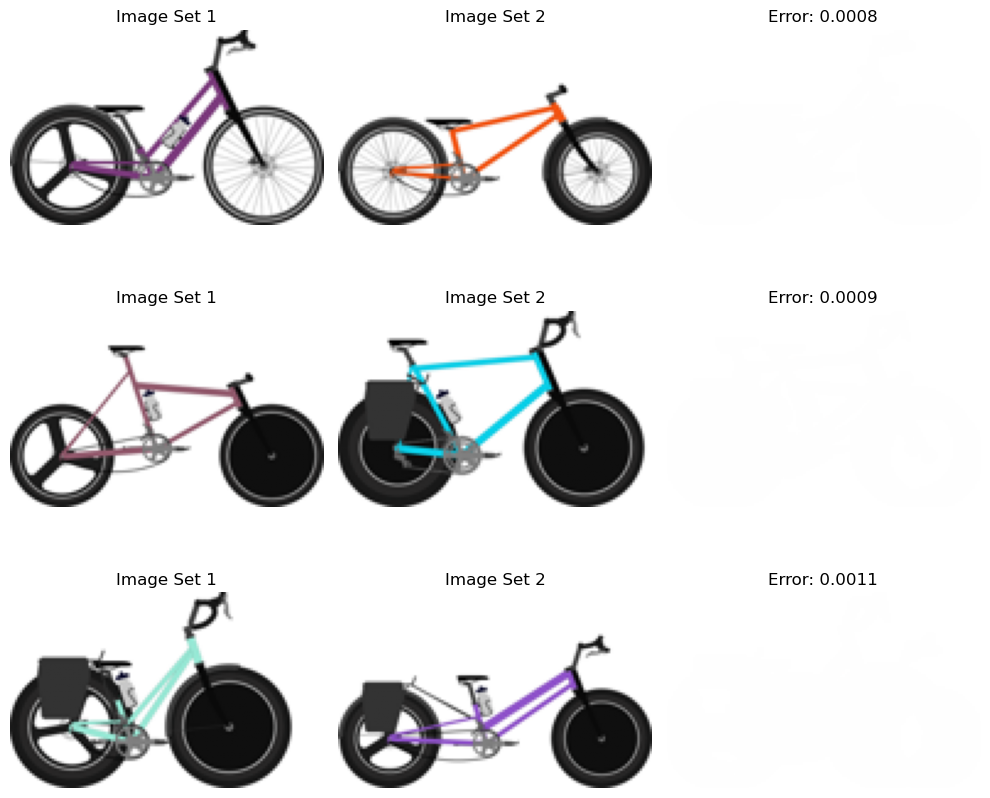

1.0


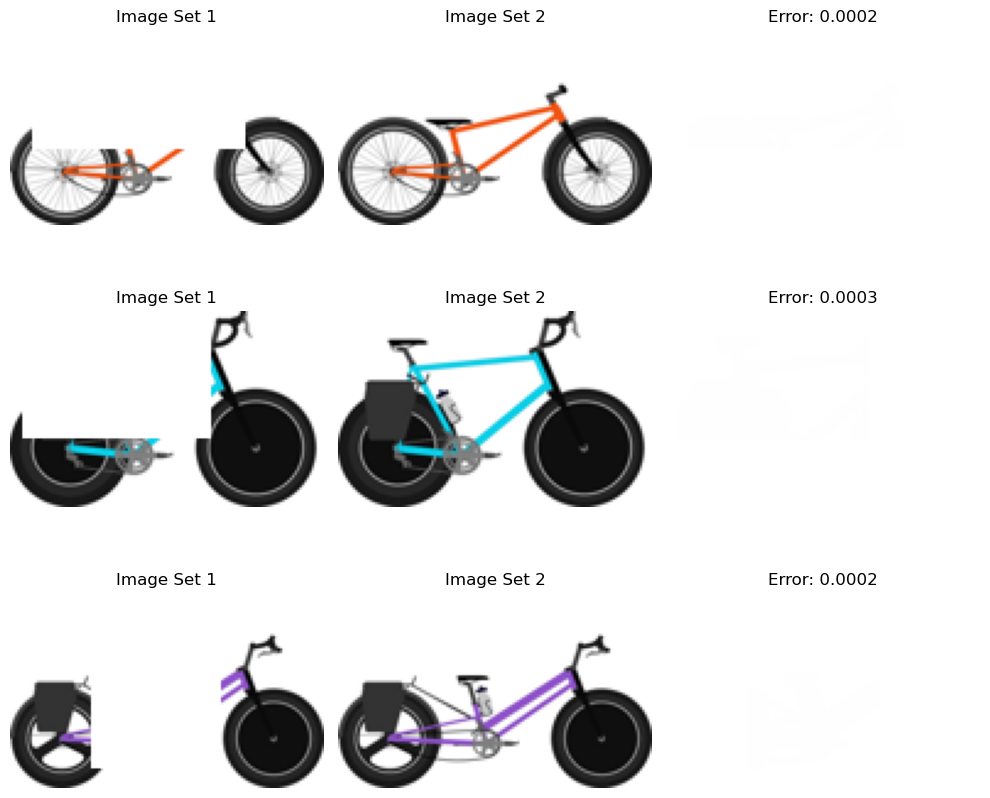

In [7]:
utils.display_images_residual(images[3:6], images[:3])
utils.display_images_residual(masked_images[:3], images[:3])

In [8]:
import torchvision.transforms.functional as F
def pad_to_square(image, target_size=(128, 128)):
    # Calculate padding for each dimension
    h, w = image.shape[1], image.shape[2]
    delta_w = target_size[1] - w
    delta_h = target_size[0] - h
    padding = (delta_w // 2, delta_h // 2, delta_w - (delta_w // 2), delta_h - (delta_h // 2))
    
    # Pad with white (255) for each side
    padded_image = F.pad(image, padding, fill=1)
    return padded_image

def preprocess(images, masked_images, mask_channels, mask_added_images):
    # Convert arrays to tensors
    images = torch.from_numpy(images).float()
    masked_images = torch.from_numpy(masked_images).float()
    mask_channels = torch.from_numpy(mask_channels).float()
    mask_added_images = torch.from_numpy(mask_added_images).float()

    # Apply padding to each image in the dataset
    images = torch.stack([pad_to_square(img) for img in images])
    masked_images = torch.stack([pad_to_square(img) for img in masked_images])
    mask_channels = torch.stack([pad_to_square(mask) for mask in mask_channels])
    mask_added_images = torch.stack([pad_to_square(img) for img in mask_added_images])
    
    return images, masked_images, mask_channels, mask_added_images

# Example usage
images, masked_images, mask_channels, mask_added_images = preprocess(images, masked_images, mask_channels, mask_added_images)

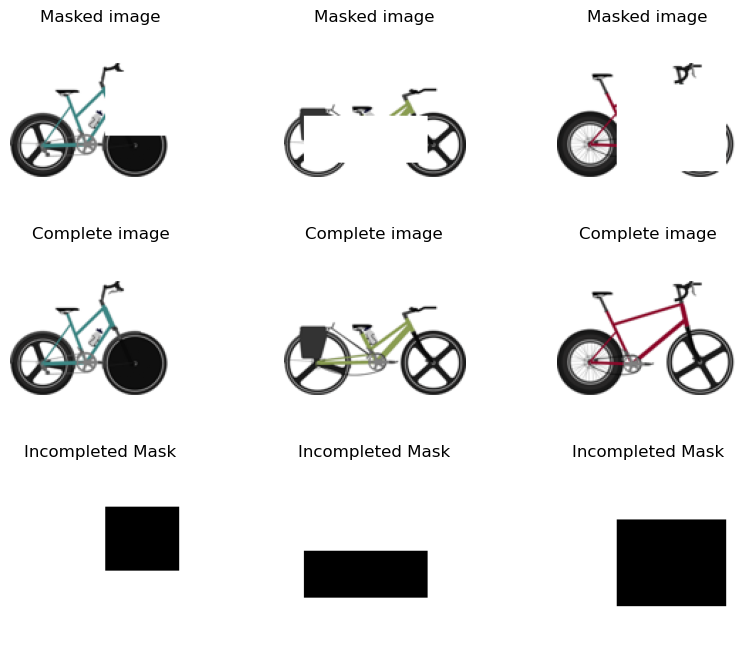

In [9]:
# display 3 random images from each set and their masks
rnd_idx = np.random.randint(0, len(mask_added_images), 3)
fig, ax = plt.subplots(3, 3, figsize=(10, 8))

for i, idx in enumerate(rnd_idx):
    ax[0, i].imshow(masked_images[idx].cpu().numpy().transpose(1, 2, 0)[:,:,0:3])
    ax[0, i].set_title("Masked image")
    ax[0, i].axis("off")
    
    ax[1, i].imshow(images[idx].cpu().numpy().transpose(1, 2, 0)[:,:,0:3])
    ax[1, i].set_title("Complete image")
    ax[1, i].axis("off")
    
    ax[2, i].imshow(mask_added_images[idx, 3].cpu().numpy().squeeze(), cmap="gray")
    ax[2, i].set_title("Incompleted Mask")
    ax[2, i].axis("off")

In [ ]:
from diffusers import UNet2DModel
from diffusers import DDPMScheduler
from accelerate import Accelerator
from diffusers.optimization import get_cosine_schedule_with_warmup
from tqdm.auto import tqdm
import torch.nn.functional as F

class ConditionalDenoisingPipeline:
    def __init__(self, model, scheduler):
        super().__init__()
        self.model = model
        self.scheduler = scheduler

    @torch.no_grad()
    def __call__(self, images, masks, num_inference_steps=50, guidance_scale=1.0):
        # Ensure model and scheduler are in evaluation mode
        self.model.eval()

        # Initialize the noisy image as the input image
        device = self.model.device
        images = images.to(device)
        masks = masks.to(device)
        masked_images = masks * images
        Bs = images.size(0)
        
        noise = torch.randn_like(images, dtype=self.model.dtype).to(self.model.device)
        
        self.scheduler.set_timesteps(num_inference_steps)
        
        for t in tqdm(self.scheduler.timesteps):
            # Get the noise level for this timestep
            model_output = self.model(torch.cat([masked_images,noise],1), t).sample
            
            noise = self.scheduler.step(model_output, t, noise).prev_sample
            

        return  (noise / 2 + 0.5).clamp(0, 1)
    
class ConditionalDenoisingDiffusion:
    def __init__(self,
                dataset,
                masks,
                image_size = 128,  # the generated image resolution
                train_batch_size = 16,
                eval_batch_size = 16,  # how many images to sample during evaluation
                num_epochs = 50,
                gradient_accumulation_steps = 1,
                learning_rate = 1e-4,
                lr_warmup_steps = 500,
                mixed_precision = "fp16",  # `no` for float32, `fp16` for automatic mixed precision
                seed = 0,
                device = "cuda",  # "cuda" or "cpu"
                ):
        
        self.dataset = dataset
        self.masks = masks
        self.image_size = image_size
        self.train_batch_size = train_batch_size
        self.eval_batch_size = eval_batch_size
        self.num_epochs = num_epochs
        self.gradient_accumulation_steps = gradient_accumulation_steps
        self.learning_rate = learning_rate
        self.lr_warmup_steps = lr_warmup_steps
        self.mixed_precision = mixed_precision
        self.seed = seed
        self.device = device
        
        self.train_set, self.val_set = random_split(self.dataset, [int(0.8 * len(self.dataset)), len(self.dataset) - int(0.8 * len(self.dataset))])
        self.dataloader = DataLoader(self.train_set, batch_size=self.train_batch_size, shuffle=True)
        self.val_loader = DataLoader(self.val_set, batch_size=self.eval_batch_size, shuffle=False)
        
        self.unet = UNet2DModel(
            sample_size=self.image_size,  # the target image resolution
            in_channels=6,  # the number of input channels, 3 for RGB images
            out_channels=3,  # the number of output channels
            layers_per_block=2,  # how many ResNet layers to use per UNet block
            block_out_channels=(64, 64, 128, 128, 256, 256),  # the number of output channels for each UNet block
            down_block_types=(
                "DownBlock2D",  # a regular ResNet downsampling block
                "DownBlock2D",
                "DownBlock2D",
                "DownBlock2D",
                "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
                "DownBlock2D",
            ),
            up_block_types=(
                "UpBlock2D",  # a regular ResNet upsampling block
                "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
                "UpBlock2D",
                "UpBlock2D",
                "UpBlock2D",
                "UpBlock2D",
            ),
        ).to(self.device)
        
        self.noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
        self.optimizer = torch.optim.AdamW(self.unet.parameters(), lr=self.learning_rate)
        self.lr_scheduler = get_cosine_schedule_with_warmup(
            optimizer=self.optimizer,
            num_warmup_steps=self.lr_warmup_steps,
            num_training_steps=(len(self.dataloader) * self.num_epochs),
        )
        self.current_epoch = 0
        
        self.denoiser = ConditionalDenoisingPipeline(self.unet, self.noise_scheduler)
    
    def reset_epoch(self):
        self.current_epoch = 0
        self.lr_scheduler.last_epoch = 0
        
    def train(self, n_epoch=None):
        if n_epoch is None:
            n_epoch = self.num_epochs
        
        accelerator = Accelerator(
            mixed_precision=self.mixed_precision,
            gradient_accumulation_steps=self.gradient_accumulation_steps,
        )
        
        
        model, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
            self.unet, self.optimizer, self.dataloader, self.lr_scheduler
        )
        
        for epoch in range(self.current_epoch, n_epoch):
            model.train()
            progress = tqdm(train_dataloader)
            for _,images in progress: 
                
                images = images.to(model.device) * 2 - 1
                bs = images.size(0)
                # create random masks
                rnd_idx = np.random.randint(0, len(self.masks), len(images))
                masks = self.masks[rnd_idx].to(model.device)
                masked_images = images * masks
                noise = torch.randn(images.shape, device=images.device)
                timesteps = torch.randint(
                    0, self.noise_scheduler.config.num_train_timesteps, (bs,), device=images.device,
                    dtype=torch.int64
                )
                
                noisy_images = self.noise_scheduler.add_noise(images, noise, timesteps)
                
                with accelerator.accumulate(model):
                    noise_pred = model(torch.cat([masked_images,noisy_images],1), timesteps, return_dict=False)[0]
                    
                    loss = F.mse_loss(noise_pred, noise)
                    accelerator.backward(loss)
                    
                    if accelerator.sync_gradients:
                        accelerator.clip_grad_norm_(model.parameters(), 1.0)
                        
                    optimizer.step()
                    lr_scheduler.step()
                    optimizer.zero_grad()
                
                progress.set_postfix_str(f"Epoch: {epoch}/{self.num_epochs}, Loss: {loss.item():.7f}")
                
            # unmasks one batch of validation images
            masks, images = next(iter(self.val_loader))
            masked_images = images * masks
            masks = masks.to(model.device)
            images = images.to(model.device) * 2 - 1
            
            unmasked_images = self.denoiser(images[:4], masks[:4], num_inference_steps=50)
            
            # plot the first 4 images
            fig, ax = plt.subplots(2, 4, figsize=(16, 8))
            for i in range(4):
                ax[0, i].imshow(unmasked_images[i].cpu().numpy().transpose(1, 2, 0))
                ax[0, i].set_title("Unmasked image")
                ax[0, i].axis("off")
                
                ax[1, i].imshow(masked_images[i].cpu().numpy().transpose(1, 2, 0))
                ax[1, i].set_title("Masked image")
                ax[1, i].axis("off")
                
            plt.show()
    
    def unmask(self, images, masks, num_inference_steps=100):
        self.unet.eval()
        return self.denoiser(images, masks, num_inference_steps=num_inference_steps)

  0%|          | 0/50 [00:00<?, ?it/s]

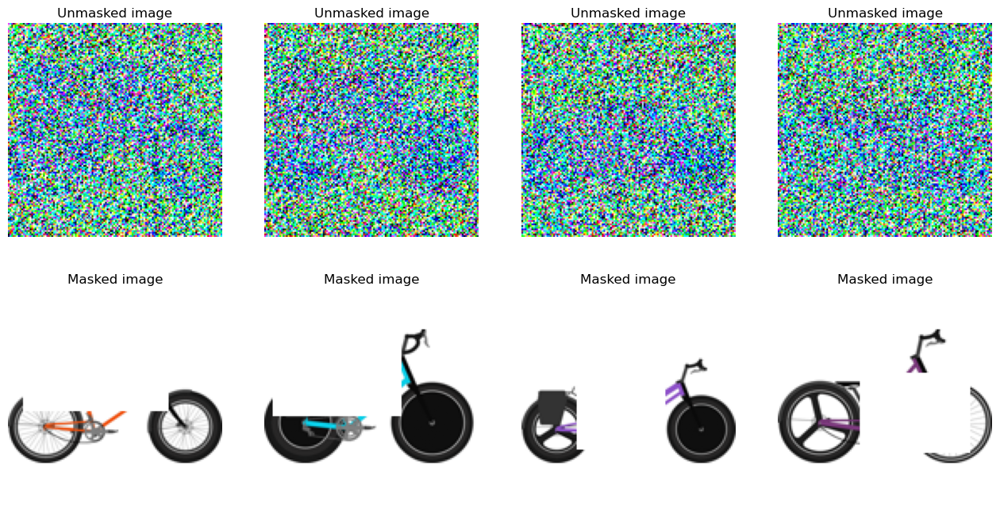

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dataset = TensorDataset(mask_channels, images)  # mask_added_images as input, images as target

ConditionalModel = ConditionalDenoisingDiffusion(dataset, mask_channels, device=device)

# lets just unmask without training first
unmasked_images = ConditionalModel.unmask(images[:4] * 2 - 1, mask_channels[:4], num_inference_steps=50)

fig, ax = plt.subplots(2, 4, figsize=(16, 8))
for i in range(4):
    ax[0, i].imshow(unmasked_images[i].cpu().numpy().transpose(1, 2, 0))
    ax[0, i].set_title("Unmasked image")
    ax[0, i].axis("off")

    ax[1, i].imshow(masked_images[i].cpu().numpy().transpose(1, 2, 0))
    ax[1, i].set_title("Masked image")
    ax[1, i].axis("off")

Not so good yet. Now let's train it to denoise:

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

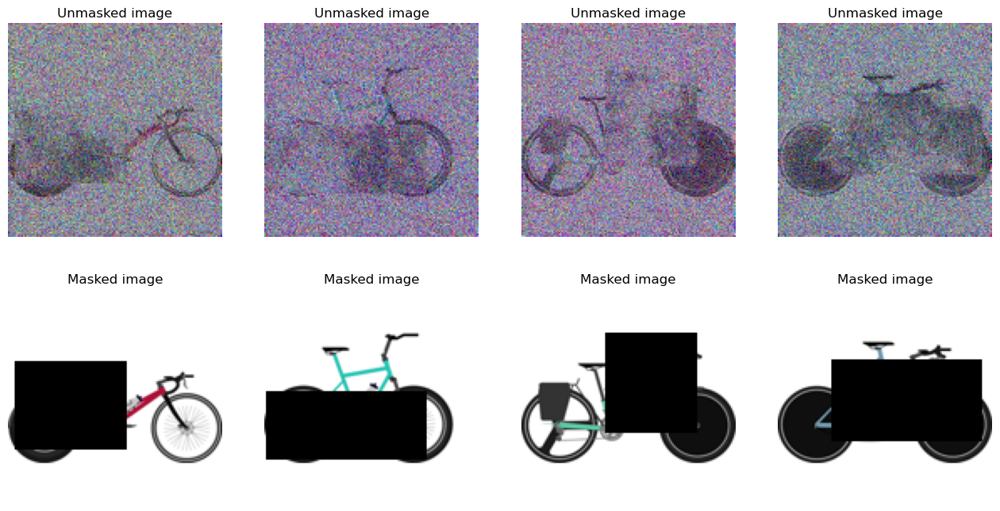

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

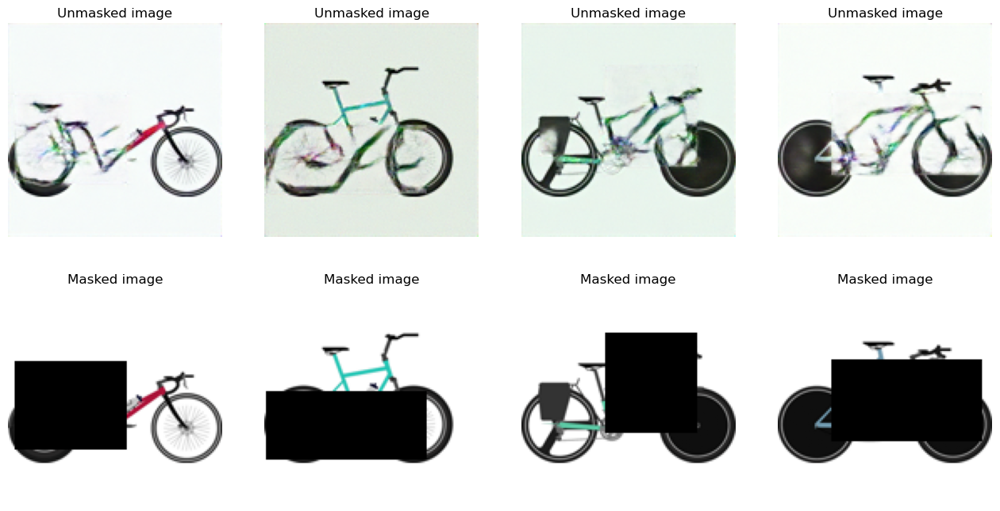

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

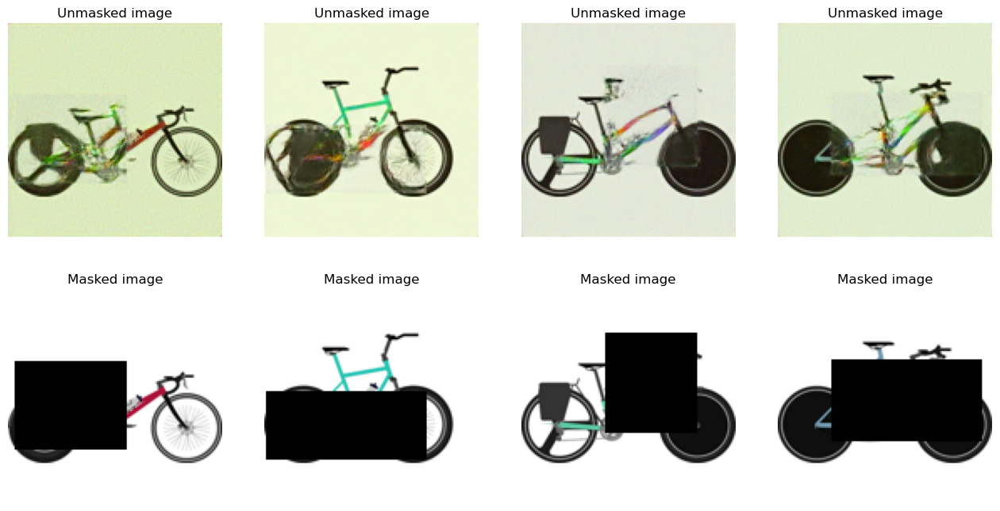

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

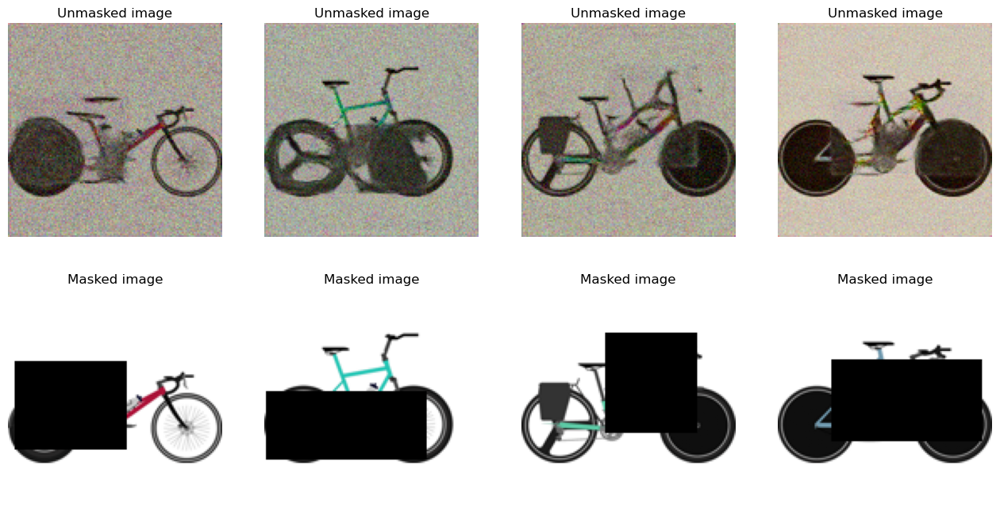

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

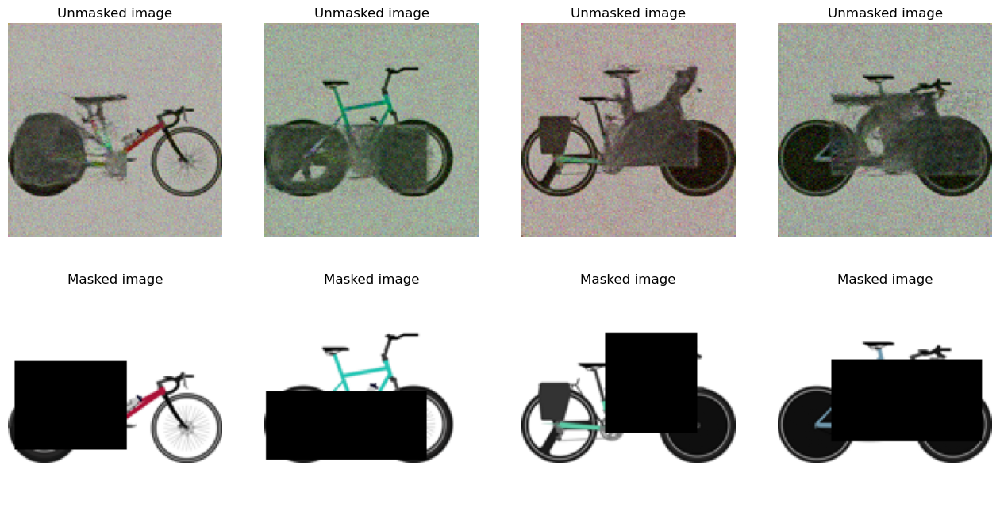

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

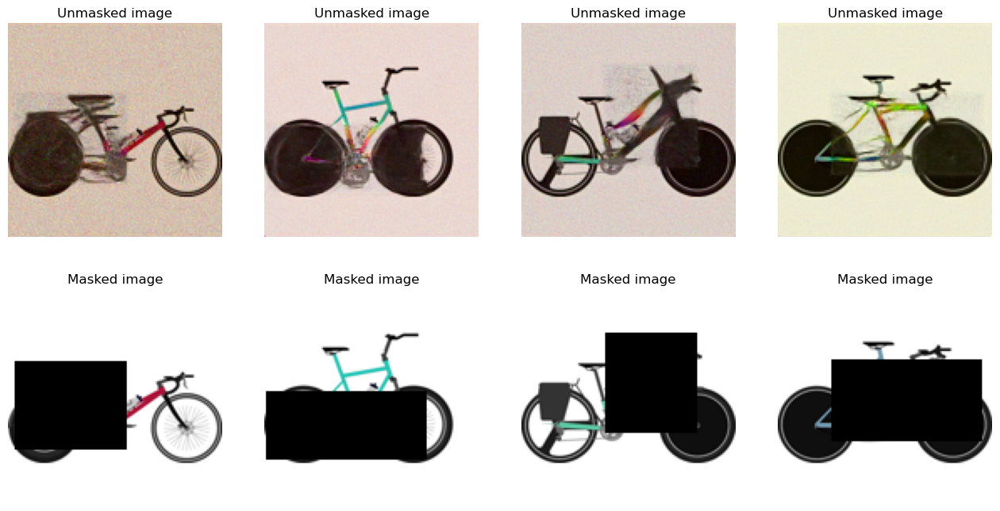

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

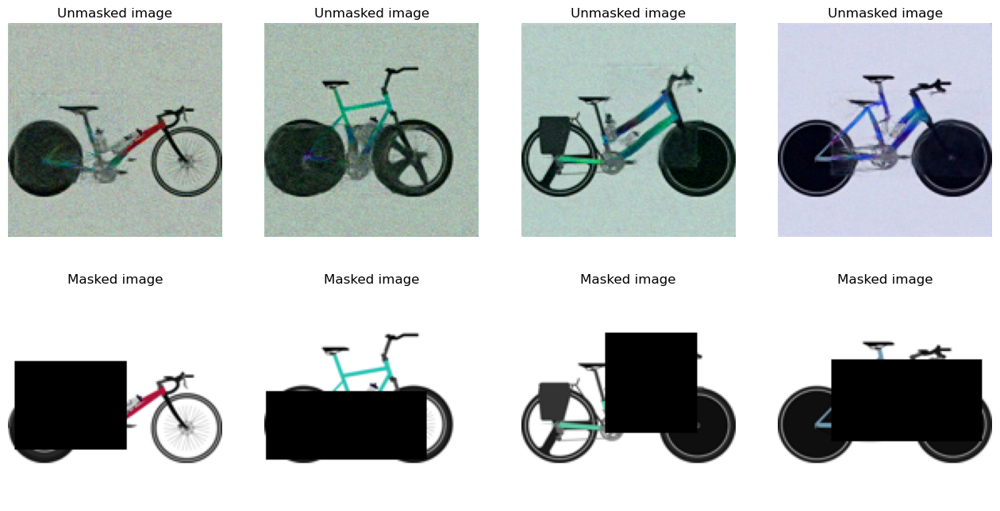

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

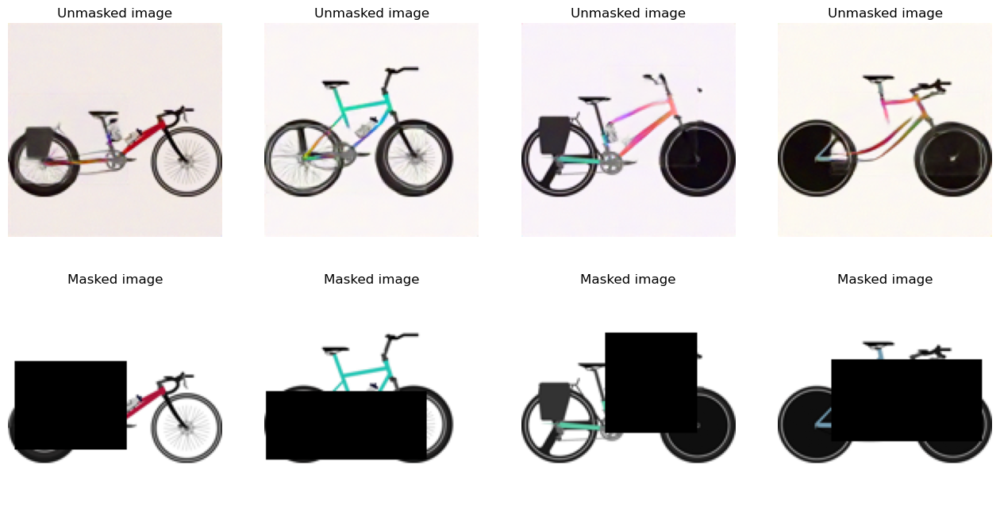

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

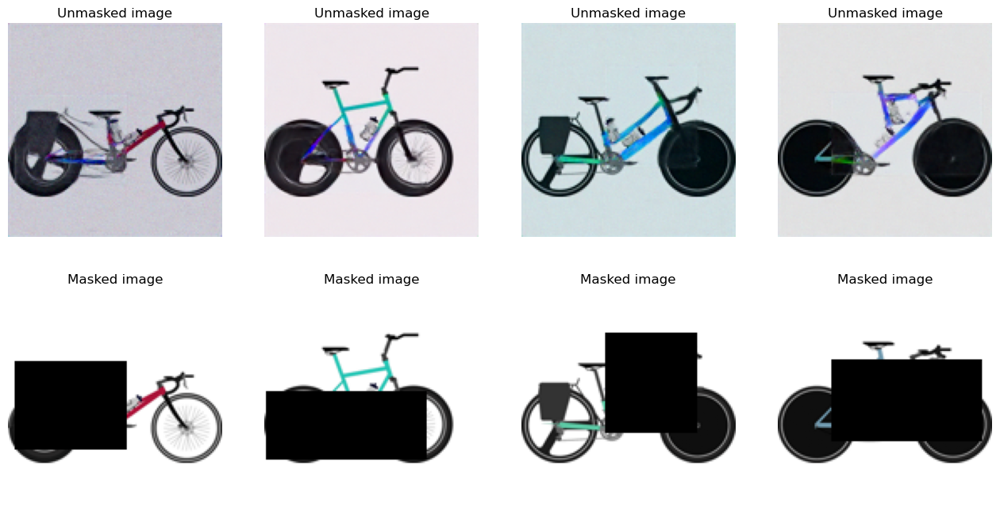

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

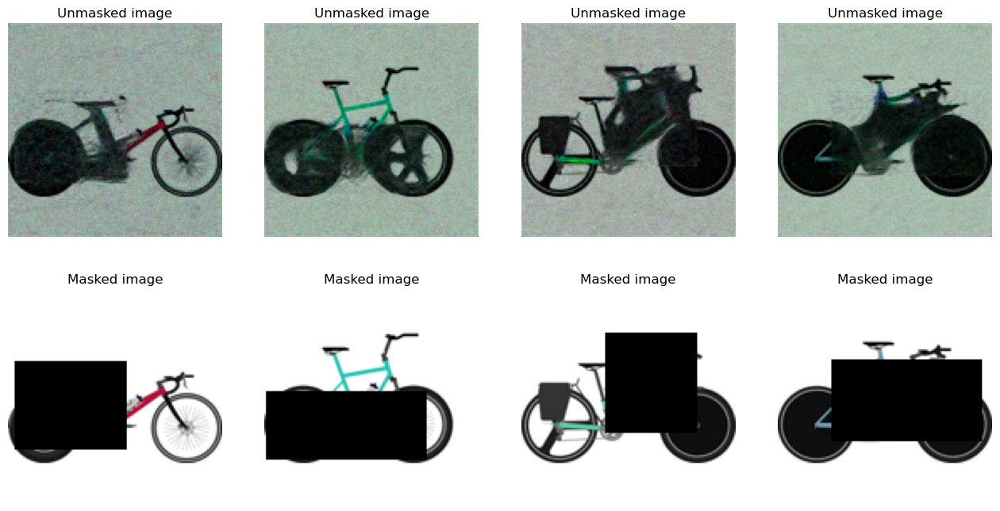

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

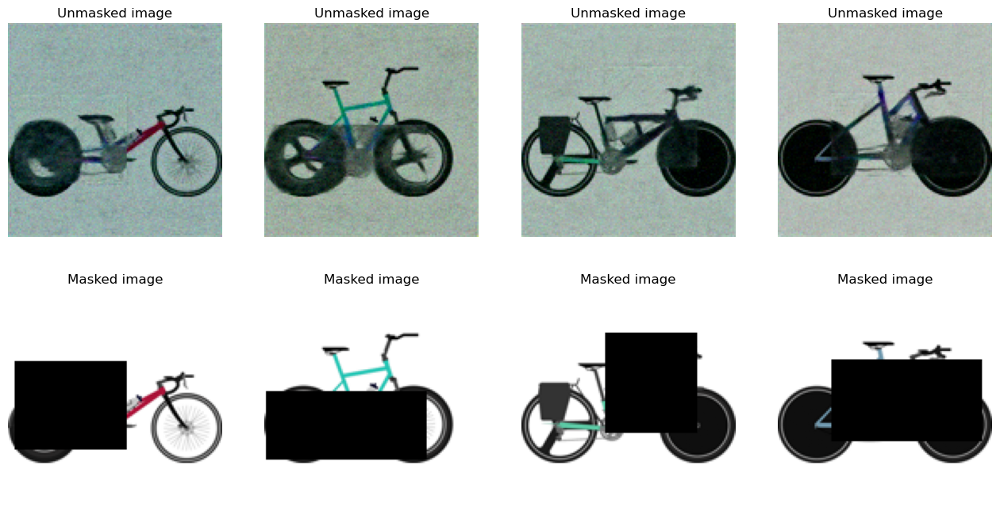

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

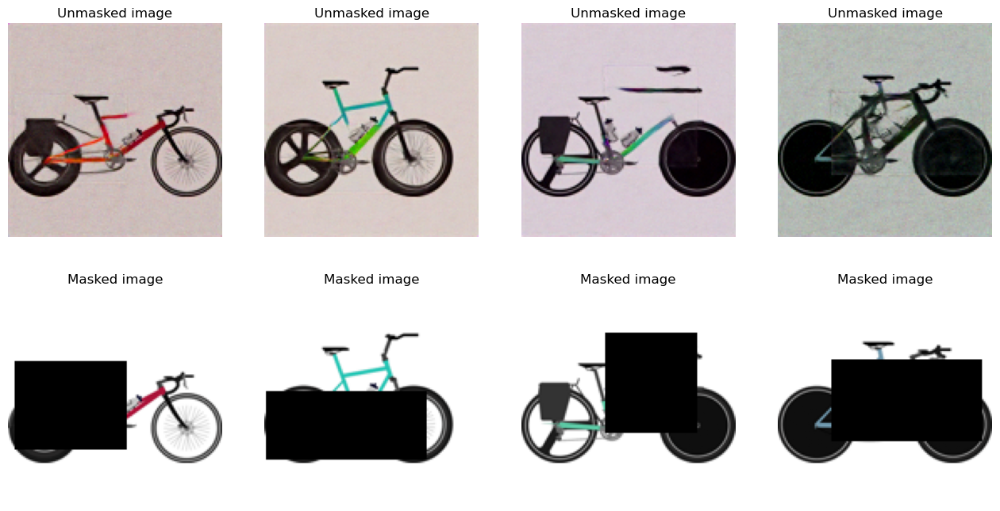

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

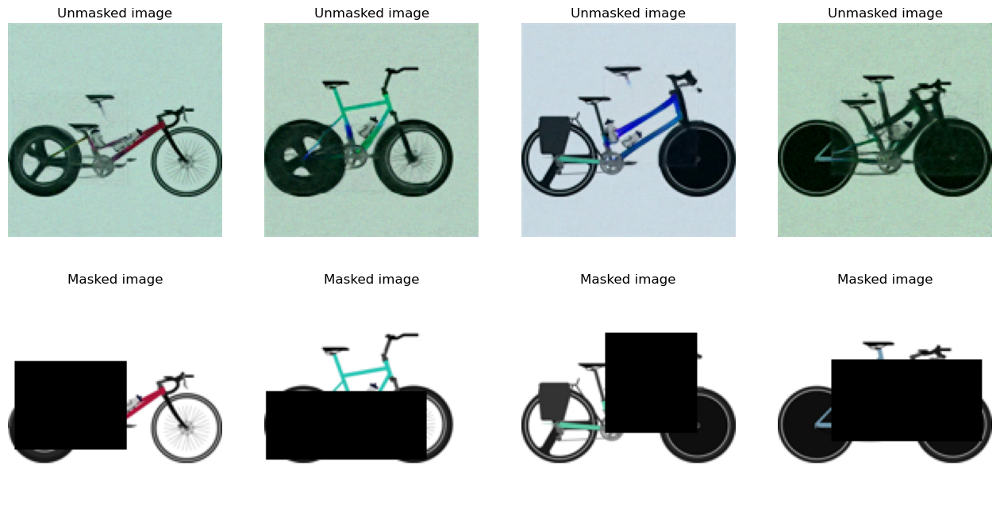

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

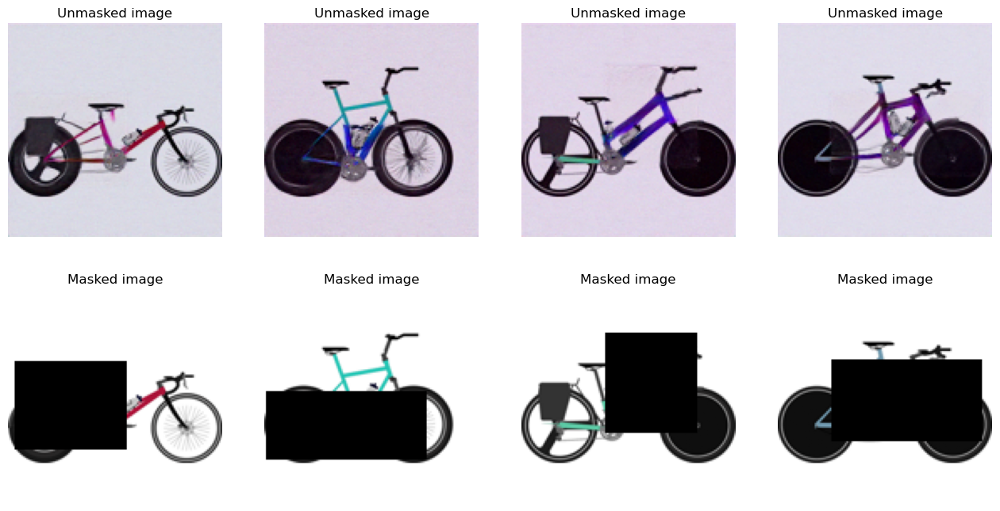

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

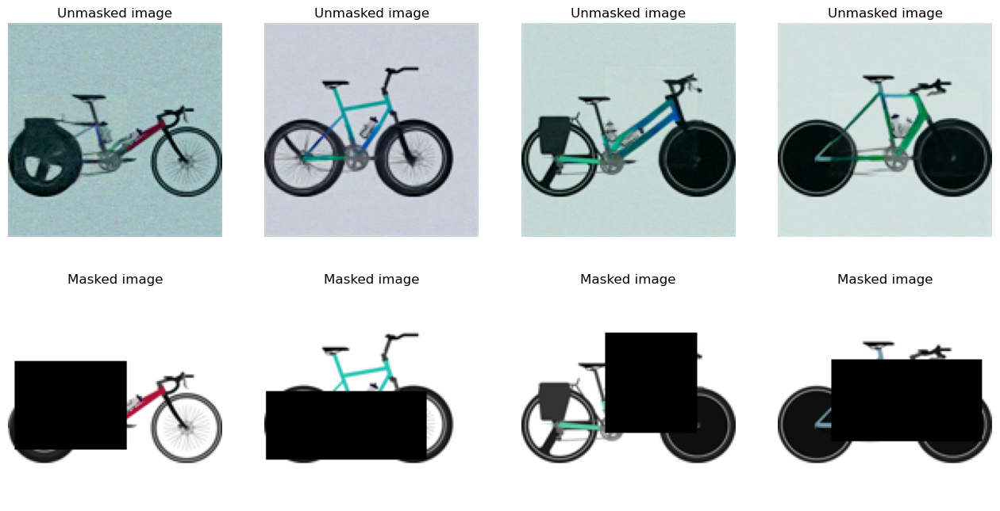

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

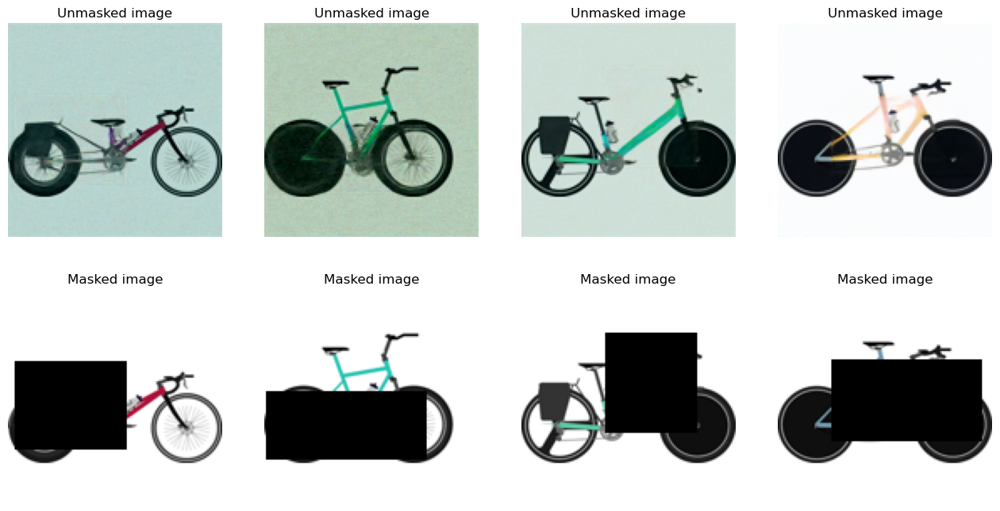

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

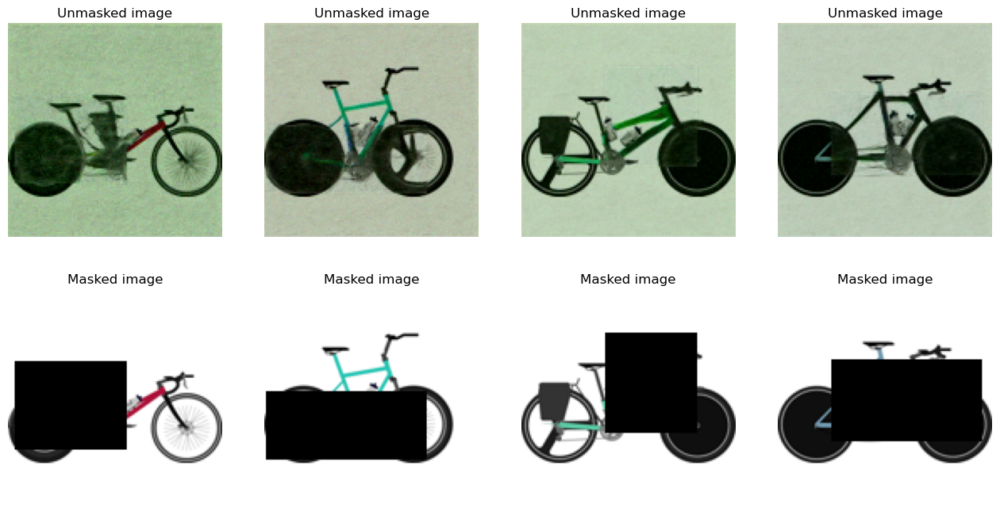

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

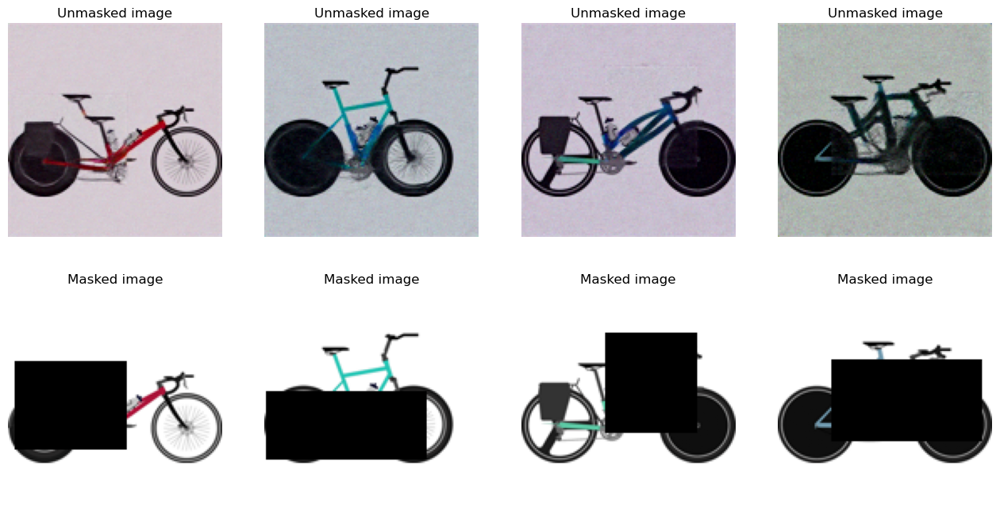

  0%|          | 0/500 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [15]:
ConditionalModel.train(30)

  0%|          | 0/500 [00:00<?, ?it/s]

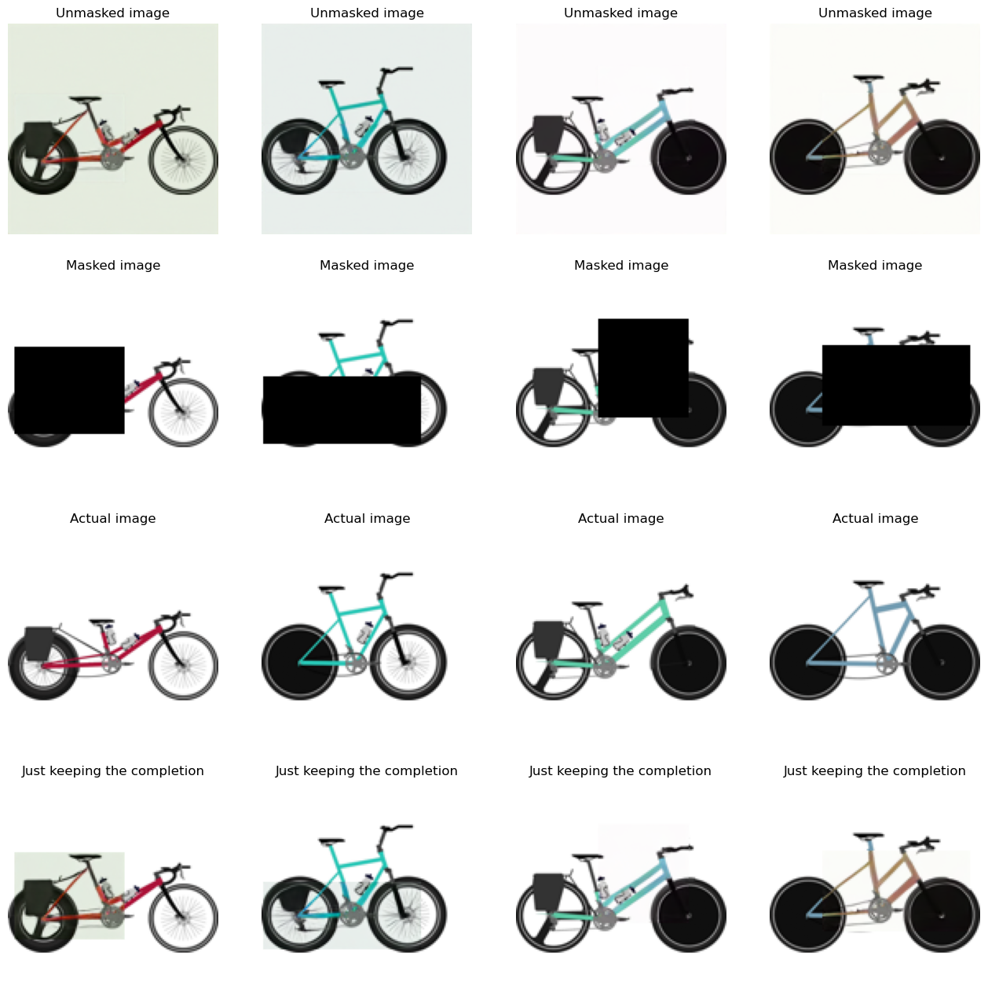

In [20]:
masks, images = next(iter(ConditionalModel.val_loader))
images = images
masked_images = images * masks
unmasked_images = ConditionalModel.unmask(images[:4] * 2 - 1, masks[:4], num_inference_steps=500)

fig, ax = plt.subplots(4, 4, figsize=(16, 16))
for i in range(4):
    ax[0, i].imshow(unmasked_images[i].cpu().numpy().transpose(1, 2, 0))
    ax[0, i].set_title("Unmasked image")
    ax[0, i].axis("off")

    ax[1, i].imshow(masked_images[i].cpu().numpy().transpose(1, 2, 0))
    ax[1, i].set_title("Masked image")
    ax[1, i].axis("off")
    
    ax[2, i].imshow(images[i].cpu().numpy().transpose(1, 2, 0))
    ax[2, i].set_title("Actual image")
    ax[2, i].axis("off")
    
    ax[3, i].imshow((masks[i]*images[i] + (1-masks[i])*unmasked_images[i].cpu()).cpu().numpy().squeeze().transpose(1, 2, 0), cmap="gray")
    ax[3, i].set_title("Just keeping the completion")
    ax[3, i].axis("off")